In [17]:
import scanpy as sc
import warnings
warnings.filterwarnings('ignore')
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..", "utils")))
from analysis_utils import (
    volcano_plot_br,
    plot_spatial_clusters_per_sample,
    plot_dotplot_by_treatment,
    plot_relative_cluster_composition,
    score_and_plot_modules
)
import scanpy as sc
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [2]:
basedir = '/Volumes/processing2/ST_BRICHOS/data/'

In [3]:
adata = sc.read_h5ad(basedir + 'ST_BRICHOS_region_subcluster.h5ad')
adata.X = adata.layers['counts']
adata.X = adata.X.astype(int)

In [5]:
adata.obs

,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres,sample,sample_id,n_genes,leiden,treatment,...,leiden_1,leiden_1.5,leiden_2,leiden_2.5,PIG_score,OLIG_score,leiden_0.1,leiden_0.2,leiden_0.3,re_annotation_regions
AAACAAGTATCTCCCA-1-P24215_301,1,50,102,28217,34029,P24215_301,P24215_301,5333,6,BRICHOS,...,3,13,11,35,0.093254,0.006935,0,5,5,Olfactory areas
AAACAGAGCGACTCCT-1-P24215_301,1,14,94,10018,31732,P24215_301,P24215_301,3317,1,BRICHOS,...,4,5,17,7,0.374221,1.611454,3,2,3,Hypothalamus
AAACCGGGTAGGTACC-1-P24215_301,1,42,28,24142,12539,P24215_301,P24215_301,4982,0,BRICHOS,...,1,1,1,14,0.229887,0.858781,0,1,1,Supragranualar layers
AAACCGTTCGTCCAGG-1-P24215_301,1,52,42,29202,16598,P24215_301,P24215_301,6046,0,BRICHOS,...,6,3,0,11,0.012875,0.548931,0,3,2,Infragranular layers
AAACCTCATGAAGTTG-1-P24215_301,1,37,19,21611,9928,P24215_301,P24215_301,6179,0,BRICHOS,...,1,1,1,14,0.076070,0.235175,0,1,1,Supragranualar layers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1-P28052_203,1,24,64,15524,23040,P28052_203,P28052_203,7233,4,PBS,...,7,19,41,37,0.145172,1.043804,1,0,0,Caudoputamen
TTGTTGTGTGTCAAGA-1-P28052_203,1,31,77,19072,26813,P28052_203,P28052_203,7315,4,PBS,...,7,19,41,37,0.225508,0.990587,1,0,0,Caudoputamen
TTGTTTCATTAGTCTA-1-P28052_203,1,60,30,33717,13124,P28052_203,P28052_203,6504,1,PBS,...,4,5,5,15,0.168308,0.581865,3,2,3,Hypothalamus
TTGTTTCCATACAACT-1-P28052_203,1,45,27,26128,12265,P28052_203,P28052_203,5322,1,PBS,...,4,29,17,27,0.307190,0.876207,3,2,3,Hypothalamus


In [6]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

def distance_to_region_per_array(
    adata,
    region_col="re_annotation_regions",
    region_value="meninges",
    array_col="sample_id",   # change to your column, e.g. "sample_id" or "library_id"
    x_col="array_row",          # or "x" / "X" depending on your data
    y_col="array_col",          # or "y" / "Y"
    out_col="dist_to_meninges",
    fill_value=np.nan,
):
    """
    Adds adata.obs[out_col] = distance to nearest cell where obs[region_col]==region_value,
    computed separately within each array_col group.
    """
    obs = adata.obs

    # basic checks
    for c in [region_col, array_col, x_col, y_col]:
        if c not in obs.columns:
            raise KeyError(f"Missing adata.obs['{c}']")

    # prep output
    dist = pd.Series(fill_value, index=obs.index, dtype=float)

    # loop arrays
    for arr in obs[array_col].astype(str).unique():
        idx_arr = obs.index[obs[array_col].astype(str) == arr]
        obs_arr = obs.loc[idx_arr]

        # target (meninges) cells in this array
        idx_target = obs_arr.index[obs_arr[region_col] == region_value]
        if len(idx_target) == 0:
            # no meninges in this array -> keep NaN
            continue

        # build KD-tree on target coords
        target_xy = obs.loc[idx_target, [x_col, y_col]].to_numpy(dtype=float)
        tree = cKDTree(target_xy)

        # query all cells in the array
        query_xy = obs_arr[[x_col, y_col]].to_numpy(dtype=float)
        d, _ = tree.query(query_xy, k=1)

        dist.loc[idx_arr] = d

    adata.obs[out_col] = dist.values
    return adata

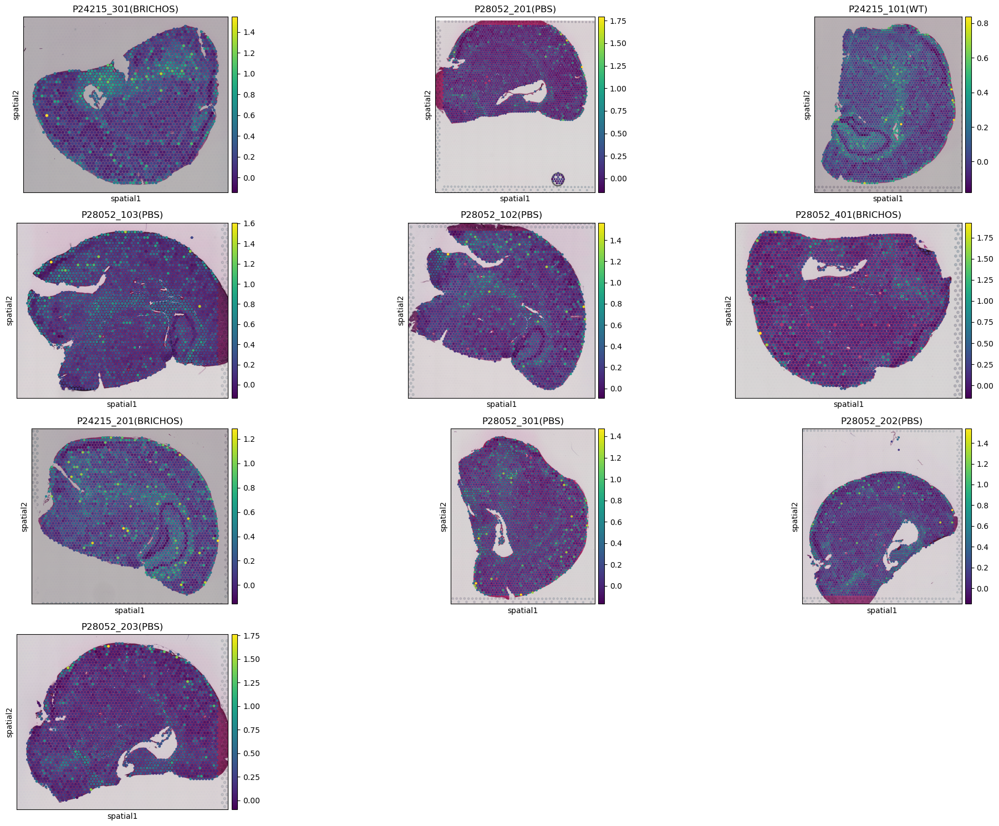

In [63]:
plot_spatial_clusters_per_sample(adata, color = 'PIG_score', figsize=(20,15), )

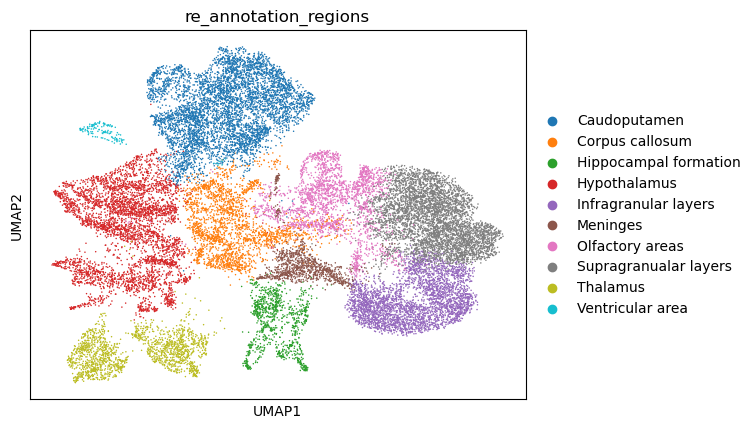

In [109]:
sc.pl.umap(adata, color = 're_annotation_regions')

In [113]:
adata

AnnData object with n_obs × n_vars = 25660 × 18751
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'sample', 'sample_id', 'n_genes', 'leiden', 'treatment', 'barcode', 'region_annotation', 'leiden_0.5', 'leiden_0.75', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'PIG_score', 'OLIG_score', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 're_annotation_regions', 'dist_to_meninges'
    var: 'n_cells'
    uns: 'dendrogram_treatment', 'leiden', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.3_colors', 'leiden_0.5_colors', 'leiden_0.75_colors', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2.5_colors', 'leiden_2_colors', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'region_annotation_colors', 'sample_id_colors', 'spatial', 'spatial_metadata_per_sample', 'umap', 're_annotation_regions_colors'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

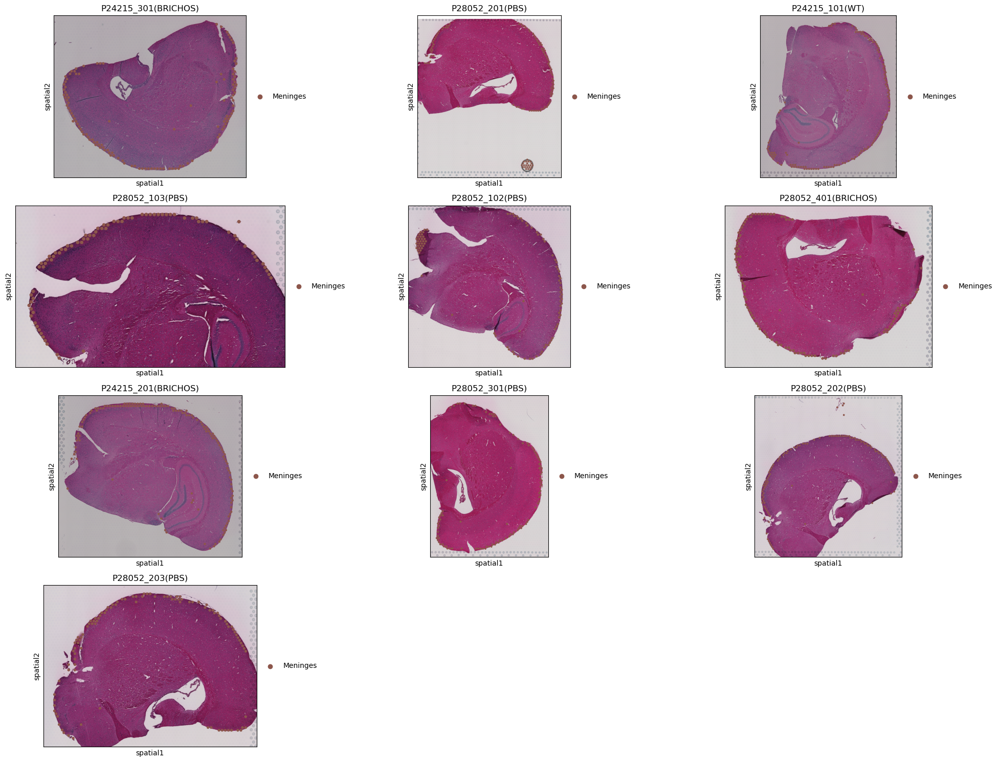

In [111]:
plot_spatial_clusters_per_sample(adata[adata.obs.re_annotation_regions == 'Meninges'], color = 're_annotation_regions', figsize=(20,15), )

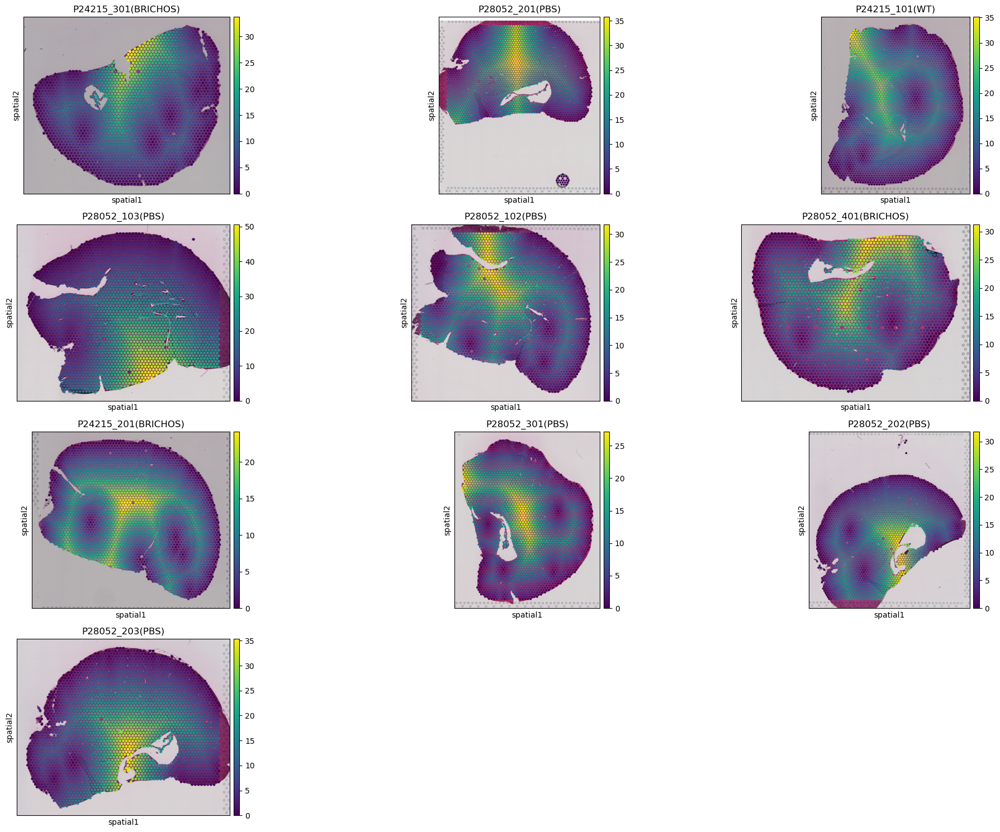

In [24]:
plot_spatial_clusters_per_sample(adata, color = 'dist_to_meninges', figsize=(20,15), )

In [117]:
import numpy as np
import pandas as pd
from scipy.spatial import ConvexHull
from shapely.geometry import Polygon, Point


def add_dist_to_tissue_border_per_sample(
    adata,
    sample_col: str = "sample_id",
    x_col: str = "centroid_x",
    y_col: str = "centroid_y",
    out_dist_col: str = "dist_to_tissue_border",
    rim_um: float = 30.0,
    out_rim_col: str = "tissue_rim_30um",
    min_points: int = 50,
):
    """
    Compute distance from each cell to the per-sample tissue border defined by the convex hull.

    Adds:
      - adata.obs[out_dist_col]: float distance to hull boundary
      - adata.obs[out_rim_col]: bool (distance < rim_um) if rim_um is not None
    """

    obs = adata.obs
    dist = pd.Series(np.nan, index=obs.index, dtype=float)

    for sid, idx in obs.groupby(sample_col).groups.items():
        idx = list(idx)
        xy = obs.loc[idx, [x_col, y_col]].to_numpy(dtype=float)

        # need enough points for a stable hull
        if xy.shape[0] < min_points:
            continue

        # convex hull -> polygon
        hull = ConvexHull(xy)
        poly = Polygon(xy[hull.vertices])

        # distance to polygon exterior for each point in this sample
        d = np.array([poly.exterior.distance(Point(x, y)) for x, y in xy], dtype=float)
        dist.loc[idx] = d

    adata.obs[out_dist_col] = dist.values

    if rim_um is not None:
        if out_rim_col is None:
            out_rim_col = f"tissue_rim_{int(rim_um)}um"
        adata.obs[out_rim_col] = adata.obs[out_dist_col] < rim_um

    return adata

In [138]:
adata = add_dist_to_tissue_border_per_sample(
    adata,
    sample_col="sample_id",
    x_col="array_row",
    y_col="array_col",
    rim_um=1.2,
    out_rim_col="tissue_rim_1.2",
)

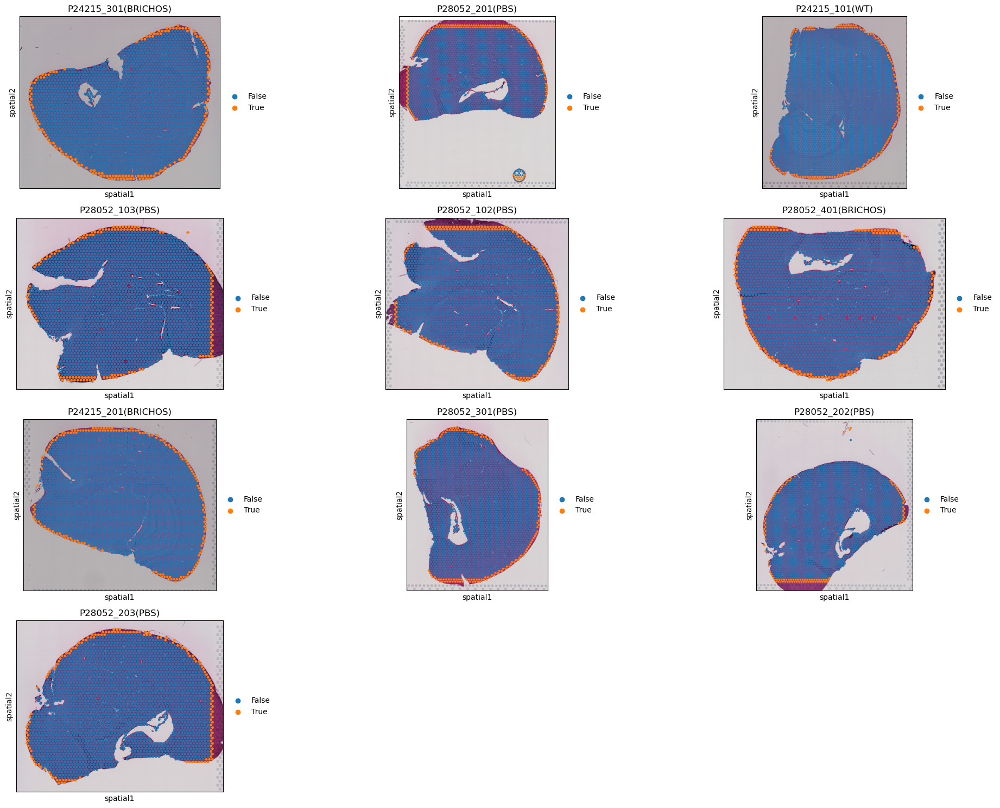

In [140]:
plot_spatial_clusters_per_sample(adata, color = 'tissue_rim_1.2', figsize=(20,15), )

In [150]:
adata.obs["tissue_border_compartment"] = np.where(
    adata.obs["tissue_rim_1.2"].fillna(False),
    "tissue_border",
    "parenchyma",
)

In [157]:
# Example: Xenium-style coords + sample_id as array
adata = distance_to_region_per_array(
    adata,
    region_col="tissue_border_compartment",
    region_value="tissue_border",
    array_col="sample_id",   # <— change if needed
    out_col="dist_to_border",
)

In [158]:
ad_brichos = adata[adata.obs["treatment"] == "BRICHOS"].copy()


In [159]:

# remove missing values
ad_brichos = ad_brichos[
    ad_brichos.obs["dist_to_border"].notna() &
    ad_brichos.obs["PIG_score"].notna()
]

In [160]:
ad_brichos.obs

,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres,sample,sample_id,n_genes,leiden,treatment,...,leiden_0.1,leiden_0.2,leiden_0.3,re_annotation_regions,dist_to_meninges,dist_to_tissue_border,tissue_rim_30um,tissue_rim_1.2,tissue_border_compartment,dist_to_border
AAACAAGTATCTCCCA-1-P24215_301,1,50,102,28217,34029,P24215_301,P24215_301,5333,6,BRICHOS,...,0,5,5,Olfactory areas,2.828427,2.828427,False,False,parenchyma,2.828427
AAACAGAGCGACTCCT-1-P24215_301,1,14,94,10018,31732,P24215_301,P24215_301,3317,1,BRICHOS,...,3,2,3,Hypothalamus,6.324555,7.353911,False,False,parenchyma,6.324555
AAACCGGGTAGGTACC-1-P24215_301,1,42,28,24142,12539,P24215_301,P24215_301,4982,0,BRICHOS,...,0,1,1,Supragranualar layers,10.295630,11.180340,False,False,parenchyma,10.295630
AAACCGTTCGTCCAGG-1-P24215_301,1,52,42,29202,16598,P24215_301,P24215_301,6046,0,BRICHOS,...,0,3,2,Infragranular layers,6.324555,6.957011,False,False,parenchyma,6.324555
AAACCTCATGAAGTTG-1-P24215_301,1,37,19,21611,9928,P24215_301,P24215_301,6179,0,BRICHOS,...,0,1,1,Supragranualar layers,9.899495,10.927278,False,False,parenchyma,9.899495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTAGCAAATTCGA-1-P24215_201,1,22,42,14147,16702,P24215_201,P24215_201,4745,6,BRICHOS,...,4,5,5,Olfactory areas,10.000000,10.909118,False,False,parenchyma,10.000000
TTGTTCAGTGTGCTAC-1-P24215_201,1,24,64,15168,23094,P24215_201,P24215_201,4719,3,BRICHOS,...,1,0,0,Caudoputamen,12.000000,13.000000,False,False,parenchyma,12.000000
TTGTTGTGTGTCAAGA-1-P24215_201,1,31,77,18713,26867,P24215_201,P24215_201,5372,3,BRICHOS,...,1,0,0,Caudoputamen,18.000000,18.819484,False,False,parenchyma,18.000000
TTGTTTCACATCCAGG-1-P24215_201,1,58,42,32351,16675,P24215_201,P24215_201,4081,11,BRICHOS,...,5,8,9,Thalamus,2.828427,3.258813,False,False,parenchyma,2.828427


In [161]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Optional, Union, Sequence


def pig_vs_distance_binned(
    adata,
    dist_col: str = "dist_to_border",
    pig_col: str = "PIG_score",
    sample_col: str = "sample_id",
    subset_col: Optional[str] = None,
    subset_values: Optional[Union[str, Sequence[str]]] = None,
    bin_size: float = 2.0,
    min_cells_per_sample_bin: int = 2,
    min_samples_per_bin: int = 3,
    plot: bool = True,
    title: Optional[str] = None,
):
    """
    Quantify PIG score as a function of distance to meninges using
    sample-level aggregation and binned distances.

    Returns
    -------
    summary : pd.DataFrame
        Columns: [dist_bin, bin_center, mean_PIG, sd_PIG, n_samples]
    per_sample : pd.DataFrame
        Sample-level binned means (useful for stats / mixed models)
    """

    # -------------------------
    # Subset if requested
    # -------------------------
    obs = adata.obs.copy()

    if subset_col is not None and subset_values is not None:
        if isinstance(subset_values, str):
            subset_values = [subset_values]
        obs = obs[obs[subset_col].isin(subset_values)]

    # -------------------------
    # Keep relevant columns
    # -------------------------
    df = obs[[sample_col, dist_col, pig_col]].dropna().copy()

    # -------------------------
    # Bin distances
    # -------------------------
    bins = np.arange(
        0,
        df[dist_col].max() + bin_size,
        bin_size,
    )

    df["dist_bin"] = pd.cut(
        df[dist_col],
        bins,
        include_lowest=True,
    )

    # -------------------------
    # Mean per (sample, bin)
    # -------------------------
    per_sample = (
        df.groupby([sample_col, "dist_bin"])
          .agg(
              mean_PIG=(pig_col, "mean"),
              n_cells=(pig_col, "count"),
          )
          .reset_index()
    )

    # Filter low-coverage bins
    per_sample = per_sample[
        per_sample["n_cells"] >= min_cells_per_sample_bin
    ]

    # -------------------------
    # Aggregate across samples
    # -------------------------
    summary = (
        per_sample.groupby("dist_bin")
          .agg(
              mean_PIG=("mean_PIG", "mean"),
              sd_PIG=("mean_PIG", "std"),
              n_samples=("mean_PIG", "count"),
          )
          .reset_index()
    )

    summary["bin_center"] = summary["dist_bin"].apply(lambda x: x.mid)

    summary = summary[
        summary["n_samples"] >= min_samples_per_bin
    ]

    # -------------------------
    # Plot
    # -------------------------
    if plot:
        fig, ax = plt.subplots(figsize=(6.5, 4.5))

        ax.bar(
            summary["bin_center"],
            summary["mean_PIG"],
            width=bin_size * 0.85,
            yerr=summary["sd_PIG"],
            capsize=3,
            alpha=0.9,
            edgecolor="black",
            linewidth=0.6,
        )

        ax.set_xlabel("Distance to meninges (µm)", fontsize=11)
        ax.set_ylabel("Mean PIG score ± SD (across samples)", fontsize=11)

        if title is None:
            title = "PIG vs distance to meninges"
        ax.set_title(title, fontsize=12, weight="bold", pad=8)

        ax.yaxis.grid(True, linestyle="--", linewidth=0.6, alpha=0.4)
        ax.xaxis.grid(False)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

        fig.tight_layout()
        plt.show()

    return summary, per_sample

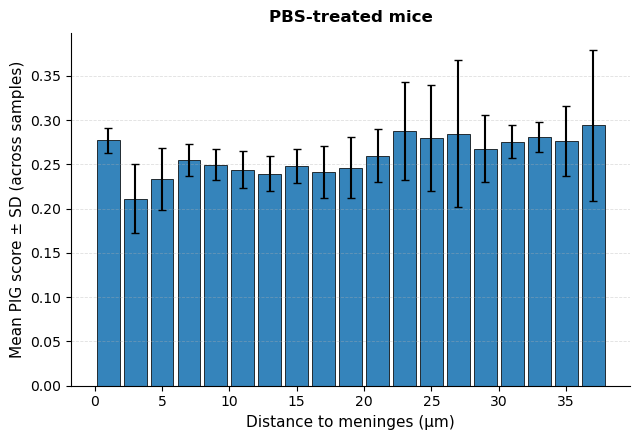

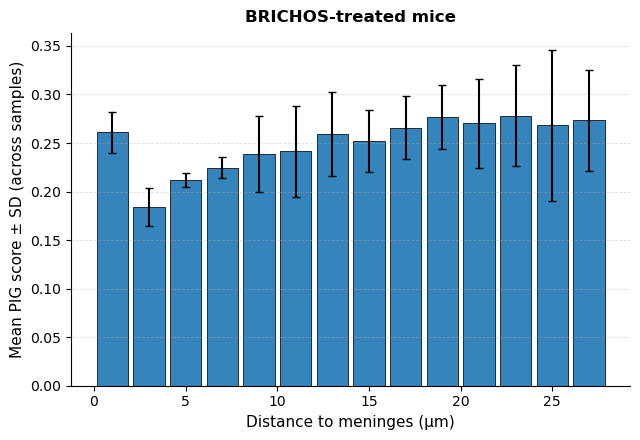

In [165]:
for cond in ["PBS", "BRICHOS"]:
    pig_vs_distance_binned(
        adata,
        subset_col="treatment",
        subset_values=cond,
        bin_size=2,
        title=f"{cond}-treated mice",
    )

In [166]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Optional, Union, Sequence


def pig_by_compartment(
    adata,
    comp_col: str = "re_annotation_regions",
    pig_col: str = "PIG_score",
    sample_col: str = "sample_id",
    subset_col: Optional[str] = None,
    subset_values: Optional[Union[str, Sequence[str]]] = None,
    min_cells_per_sample: int = 20,
    plot: bool = True,
    title: Optional[str] = None,
):
    """
    Quantify PIG score by compartment using sample-level aggregation.

    Workflow
    --------
    1) Optional subsetting (e.g. treatment == BRICHOS)
    2) Mean PIG per (sample × compartment)
    3) Aggregate across samples → mean ± SD (+ SEM)

    Returns
    -------
    summary : pd.DataFrame
        Columns: [comp_col, mean, sd, sem, n_samples]
    per_sample : pd.DataFrame
        Sample-level means (for stats / mixed models)
    """

    # -------------------------
    # Optional subsetting
    # -------------------------
    obs = adata.obs.copy()

    if subset_col is not None and subset_values is not None:
        if isinstance(subset_values, str):
            subset_values = [subset_values]
        obs = obs[obs[subset_col].isin(subset_values)]

    # -------------------------
    # Select relevant columns
    # -------------------------
    df = obs[[sample_col, comp_col, pig_col]].dropna().copy()

    # -------------------------
    # Sample-level aggregation
    # -------------------------
    per_sample = (
        df.groupby([sample_col, comp_col])[pig_col]
          .agg(mean_PIG="mean", n_cells="count")
          .reset_index()
    )

    per_sample = per_sample[
        per_sample["n_cells"] >= min_cells_per_sample
    ]

    # -------------------------
    # Across-sample summary
    # -------------------------
    summary = (
        per_sample.groupby(comp_col)["mean_PIG"]
          .agg(
              mean="mean",
              sd="std",
              n_samples="count",
          )
          .reset_index()
          .sort_values("mean", ascending=False)
    )

    summary["sem"] = summary["sd"] / np.sqrt(summary["n_samples"])

    # -------------------------
    # Plot (publication style)
    # -------------------------
    if plot:
        fig, ax = plt.subplots(figsize=(7.5, 4.5))

        ax.bar(
            summary[comp_col],
            summary["mean"],
            yerr=summary["sd"],
            capsize=3,
            alpha=0.9,
            edgecolor="black",
            linewidth=0.6,
        )

        ax.set_ylabel(
            "Mean PIG score ± SD (across samples)",
            fontsize=11,
        )

        ax.set_xlabel(
            "Compartment",
            fontsize=11,
        )

        if title is None:
            title = "PIG score by compartment"
        ax.set_title(
            title,
            fontsize=12,
            weight="bold",
            pad=8,
        )

        # Subtle grid + clean spines
        ax.yaxis.grid(True, linestyle="--", linewidth=0.6, alpha=0.4)
        ax.xaxis.grid(False)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

        ax.tick_params(axis="both", labelsize=10)
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

        fig.tight_layout()
        plt.show()

    return summary, per_sample

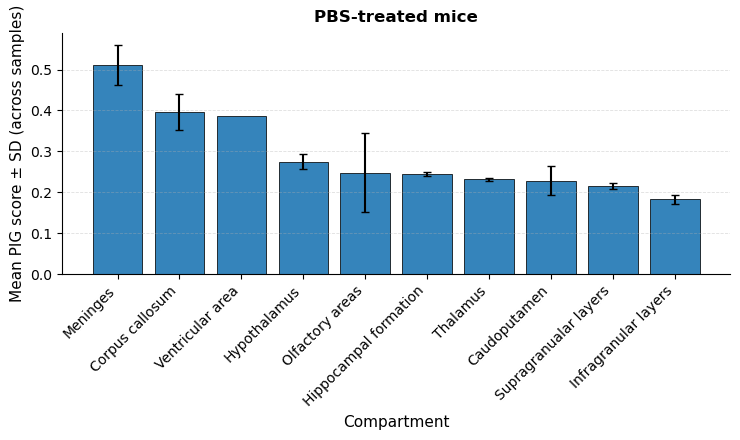

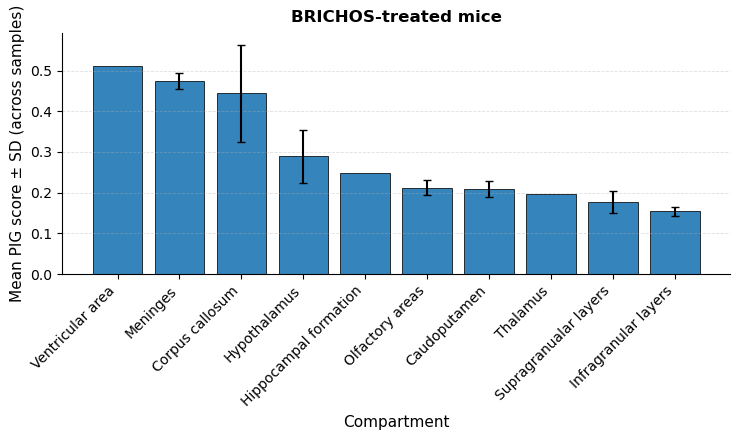

In [167]:
for cond in ["PBS", "BRICHOS"]:
    pig_by_compartment(
        adata,
        subset_col="treatment",
        subset_values=cond,
        title=f"{cond}-treated mice",
    )

In [168]:
adata_cond = adata[adata.obs.treatment != 'WT']

In [178]:
df = adata_cond.obs[
    adata_cond.obs["dist_to_border"].notna() &
    adata_cond.obs["PIG_score"].notna() &
    adata_cond.obs["treatment"].isin(["PBS", "BRICHOS"])
].copy()

df["treatment"] = pd.Categorical(
    df["treatment"],
    categories=["PBS", "BRICHOS"],  # PBS is now the reference
    ordered=True
)

df["log_dist"] = np.log1p(df["dist_to_border"])

In [179]:
import statsmodels.formula.api as smf
model = smf.mixedlm(
    "PIG_score ~ treatment * log_dist",
    df,
    groups=df["sample_id"],
)

res = model.fit()
print(res.summary())

                 Mixed Linear Model Regression Results
Model:                   MixedLM      Dependent Variable:      PIG_score
No. Observations:        22703        Method:                  REML     
No. Groups:              9            Scale:                   0.0357   
Min. group size:         2201         Log-Likelihood:          5591.5492
Max. group size:         2889         Converged:               Yes      
Mean group size:         2522.6                                         
------------------------------------------------------------------------
                              Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------------
Intercept                      0.260    0.009 30.129 0.000  0.244  0.277
treatment[T.BRICHOS]          -0.018    0.015 -1.203 0.229 -0.047  0.011
log_dist                      -0.003    0.002 -1.640 0.101 -0.006  0.001
treatment[T.BRICHOS]:log_dist  0.004    0.003  1.278 0.201 -0.002  0.

/Users/chrislangseth/miniforge3/envs/tf_sonoma_clean/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [180]:
df["meningeal_zone"] = df["dist_to_border"] < 5  # µm

summary_zone = (
    df.groupby(["treatment", "meningeal_zone"])["PIG_score"]
      .mean()
      .reset_index()
)

In [181]:
summary_zone

,treatment,meningeal_zone,PIG_score
0,PBS,False,0.255251
1,PBS,True,0.251498
2,BRICHOS,False,0.248221
3,BRICHOS,True,0.229522


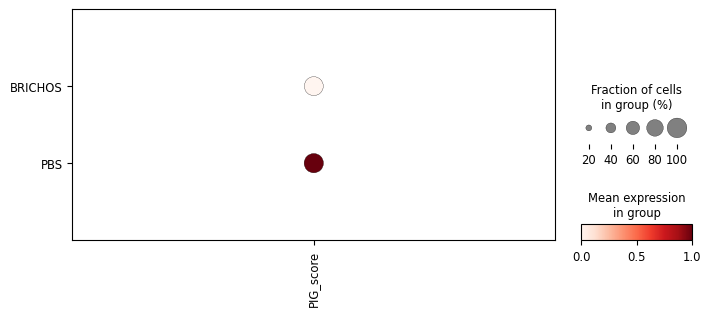

In [174]:
sc.pl.dotplot(
        adata_cond,
        var_names='PIG_score',
        groupby="treatment",
        standard_scale="var",
        color_map="Reds",
        figsize=(8, 3),
)


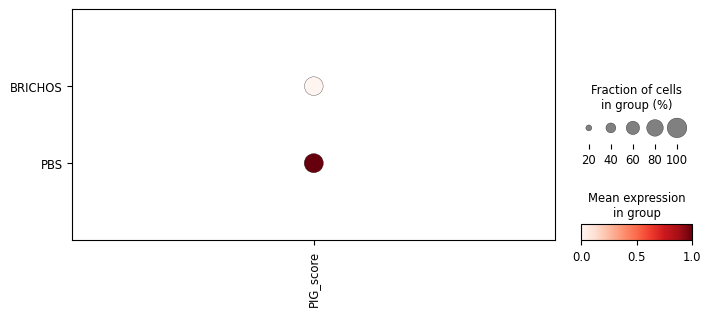

In [175]:
sc.pl.dotplot(
        adata_cond[adata_cond.obs["dist_to_meninges"] < 10],
        var_names='PIG_score',
        groupby="treatment",
        standard_scale="var",
        color_map="Reds",
        figsize=(8, 3),
)
